Analisis Kualitas Sinyal Audio Ringtone Sencha dan Marimba menggunakan metode Fourier

Kelompok 11 :
*  Elvira Rizki Berliananda.P (24031554062)
*  Maris Al Sabina Azzuhra (24031554188)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio
from scipy.signal import firwin, lfilter

**LOAD AUDIO**

In [ ]:
audio_sencha, sr_sencha = librosa.load("/content/drive/Shareddrives/PROJECT_PSD/sencha.mp3", sr=None)
audio_marimba, sr_marimba = librosa.load("/content/drive/Shareddrives/PROJECT_PSD/marimba.mp3", sr=None)
rekam_sencha, sr_rekam_sencha = librosa.load("/content/drive/Shareddrives/PROJECT_PSD/rekaman sencha.mp3", sr=None)
rekam_marimba, sr_rekam_marimba = librosa.load("/content/drive/Shareddrives/PROJECT_PSD/rekaman marimba.mp3", sr=None)

Kode berikut berfungsi untuk menampilkan waveform dan memutar audio ringtone sencha. Waveform divisualisasikan untuk menunjukkan perubahan amplitudo terhadap waktu, sedangkan fungsi Audio digunakan untuk memutar suara dengan laju sampling yang sesuai.

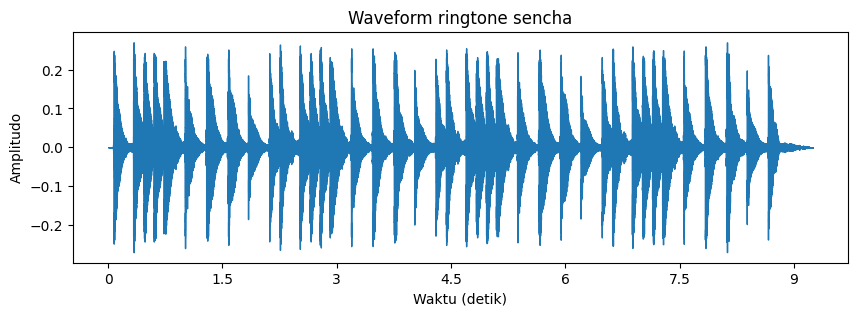

In [ ]:
plt.figure(figsize=(10,3))
librosa.display.waveshow(audio_sencha, sr=sr_sencha)
plt.title("Waveform ringtone sencha")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()
Audio(audio_sencha, rate=sr_sencha)

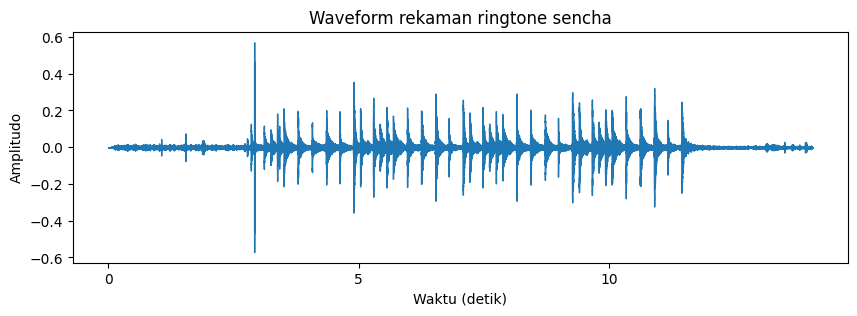

In [ ]:
plt.figure(figsize=(10,3))
librosa.display.waveshow(rekam_sencha, sr=sr_rekam_sencha)
plt.title("Waveform rekaman ringtone sencha")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()
Audio(rekam_sencha, rate=sr_rekam_sencha)

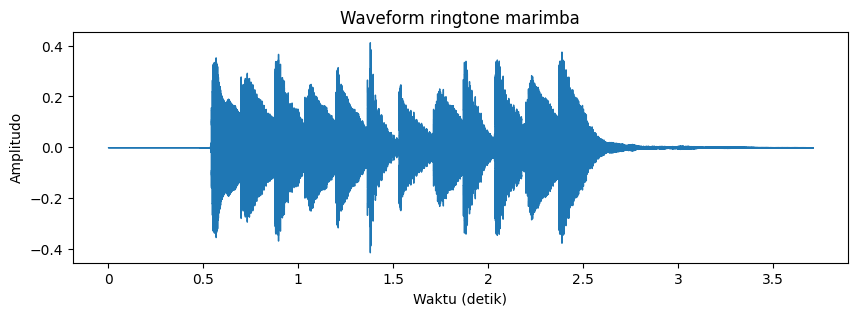

In [ ]:
plt.figure(figsize=(10,3))
librosa.display.waveshow(audio_marimba, sr=sr_marimba)
plt.title("Waveform ringtone marimba")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()
Audio(audio_marimba, rate=sr_marimba)

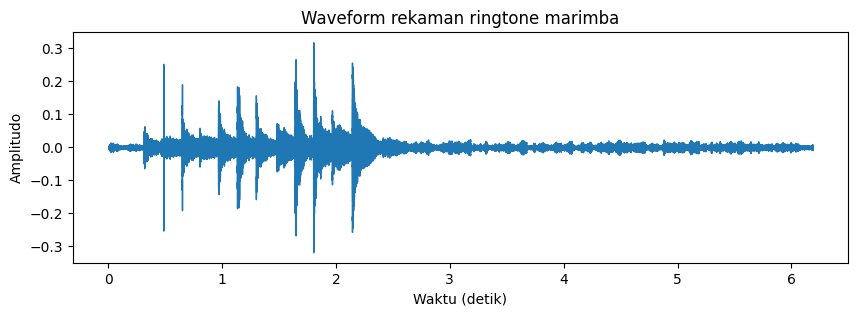

In [ ]:
plt.figure(figsize=(10,3))
librosa.display.waveshow(rekam_marimba, sr=sr_rekam_marimba)
plt.title("Waveform rekaman ringtone marimba")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()
Audio(rekam_marimba, rate=sr_rekam_marimba)

**PRE-PROCESSING (TRIMMING)**

In [ ]:
sencha_trim, index = librosa.effects.trim(audio_sencha, top_db=30)
marimba_trim, index = librosa.effects.trim(audio_marimba, top_db=30)
rekam_sencha_trim, index = librosa.effects.trim(rekam_sencha, top_db=30)
rekam_marimba_trim, index = librosa.effects.trim(rekam_marimba, top_db=30)

Kode berikut digunakan untuk menampilkan waveform dan memutar audio ringtone sencha setelah proses trimming. Waveform menunjukkan sinyal audio yang sudah dipotong terhadap waktu, sedangkan fungsi Audio digunakan untuk memutar hasil audio trimming dengan laju sampling yang sama.

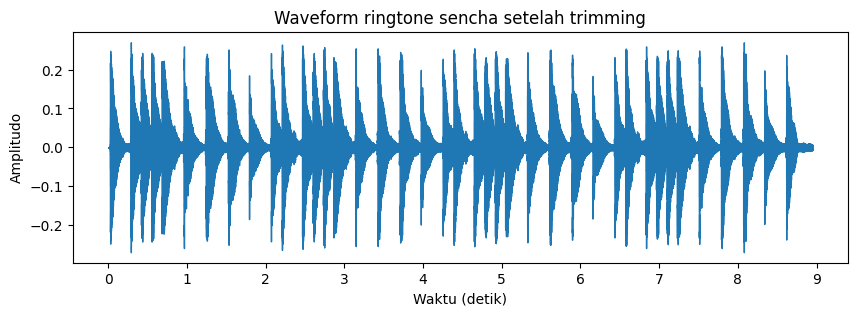

In [ ]:
plt.figure(figsize=(10, 3))
librosa.display.waveshow(sencha_trim, sr=sr_sencha)
plt.title("Waveform ringtone sencha setelah trimming")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()
Audio(data=sencha_trim, rate=sr_sencha)

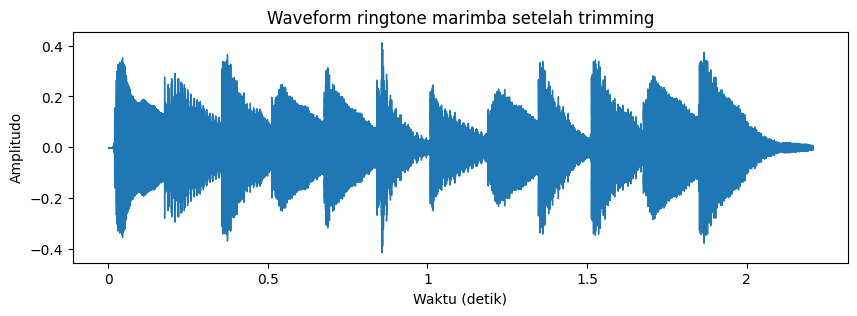

In [ ]:
plt.figure(figsize=(10, 3))
librosa.display.waveshow(marimba_trim, sr=sr_marimba)
plt.title("Waveform ringtone marimba setelah trimming")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()
Audio(data=marimba_trim, rate=sr_marimba)

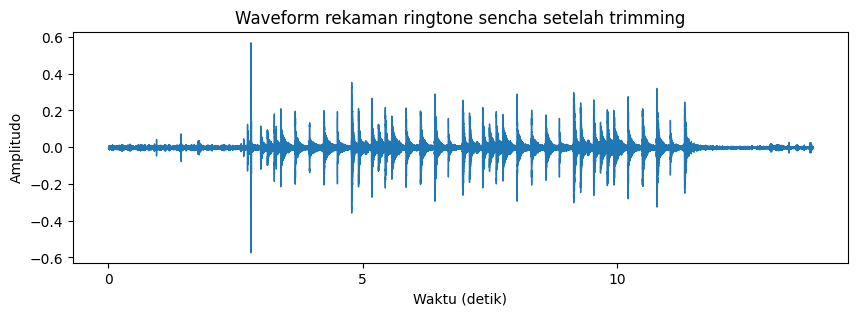

In [ ]:
plt.figure(figsize=(10, 3))
librosa.display.waveshow(rekam_sencha_trim, sr=sr_rekam_sencha)
plt.title("Waveform rekaman ringtone sencha setelah trimming")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()
Audio(data=rekam_sencha_trim, rate=sr_rekam_sencha)

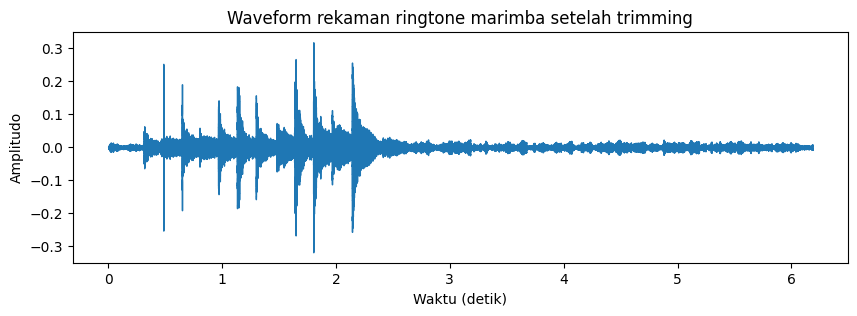

In [ ]:
plt.figure(figsize=(10, 3))
librosa.display.waveshow(rekam_marimba_trim, sr=sr_rekam_marimba)
plt.title("Waveform rekaman ringtone marimba setelah trimming")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()
Audio(data=rekam_marimba_trim, rate=sr_rekam_marimba)

**FFT**

In [ ]:
def plot_fft(x, sr, title):
    N = len(x)
    freqs = np.fft.rfftfreq(N, 1/sr)
    fft_vals = np.abs(np.fft.rfft(x))

    plt.figure(figsize=(10, 3))
    plt.plot(freqs, fft_vals)
    plt.title(title)
    plt.xlabel("Frekuensi (Hz)")
    plt.ylabel("Magnitudo")
    plt.show()

Kode tersebut mendefinisikan fungsi plot_fft untuk menampilkan spektrum frekuensi sinyal audio menggunakan FFT. Sinyal waktu diubah ke domain frekuensi untuk memperoleh nilai magnitudo pada setiap frekuensi, kemudian hasilnya divisualisasikan dalam grafik frekuensi (Hz) terhadap magnitudo.

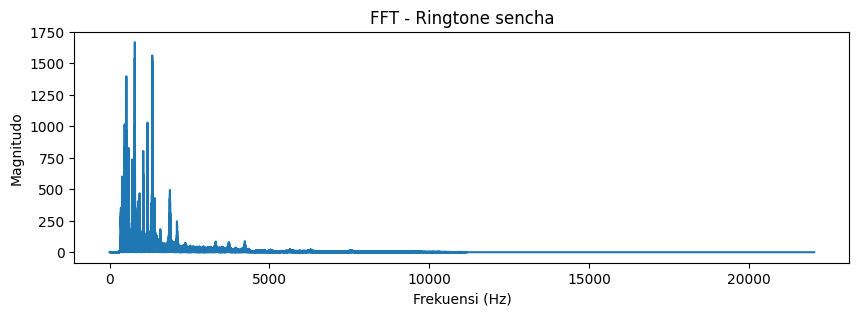

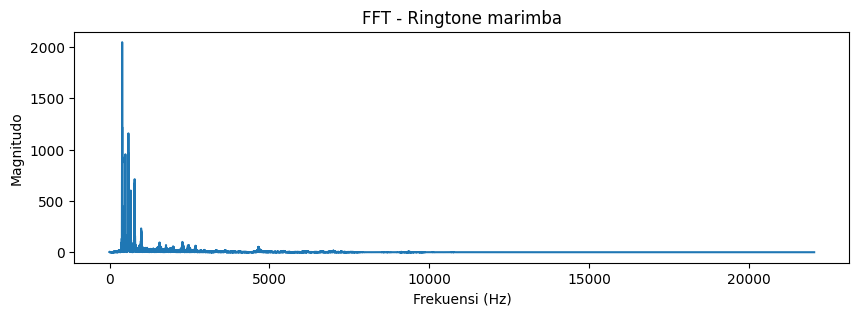

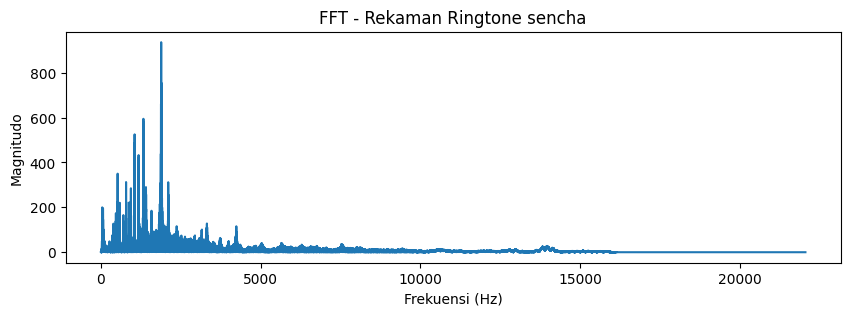

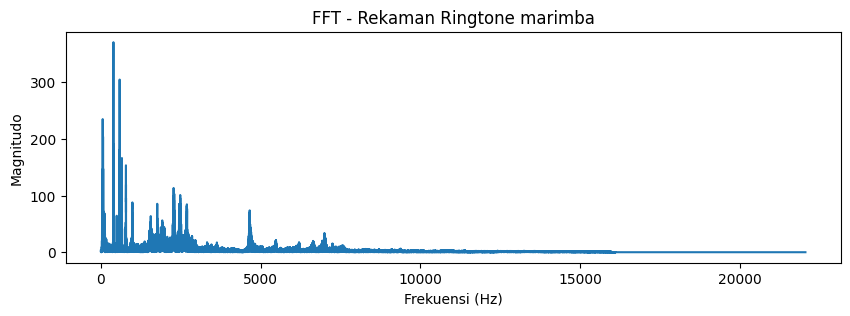

In [ ]:
plot_fft(sencha_trim, sr_sencha, "FFT - Ringtone sencha")
plot_fft(marimba_trim, sr_marimba, "FFT - Ringtone marimba")
plot_fft(rekam_sencha_trim, sr_rekam_sencha, "FFT - Rekaman Ringtone sencha")
plot_fft(rekam_marimba_trim, sr_rekam_marimba, "FFT - Rekaman Ringtone marimba")

**FIR** **Filter**

In [ ]:
def fir_lowpass_filter(signal, sr, cutoff=3000, numtaps=101):
    nyquist = sr / 2
    norm_cutoff = cutoff / nyquist
    taps = firwin(numtaps, norm_cutoff)
    filtered_signal = lfilter(taps, 1.0, signal)
    return filtered_signal

Perhitungannya dimulai dengan menentukan frekuensi Nyquist yaitu setengah dari sampling rate (sr/2). Nilai cutoff kemudian dinormalisasi dengan membaginya terhadap frekuensi Nyquist. Nilai normalisasi ini digunakan oleh firwin untuk menghitung koefisien (taps) filter FIR sebanyak numtaps. Koefisien tersebut selanjutnya dikonvolusikan dengan sinyal input melalui lfilter sehingga dihasilkan sinyal yang hanya mempertahankan frekuensi di bawah cutoff.

In [ ]:
filtered_sencha = fir_lowpass_filter(sencha_trim, sr_sencha)
filtered_marimba = fir_lowpass_filter(marimba_trim, sr_marimba)
filtered_rekam_sencha = fir_lowpass_filter(rekam_sencha_trim, sr_rekam_sencha)
filtered_rekam_marimba = fir_lowpass_filter(rekam_marimba_trim, sr_rekam_marimba)

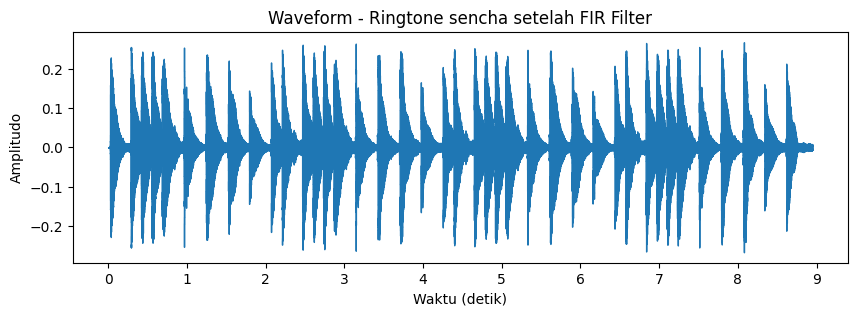

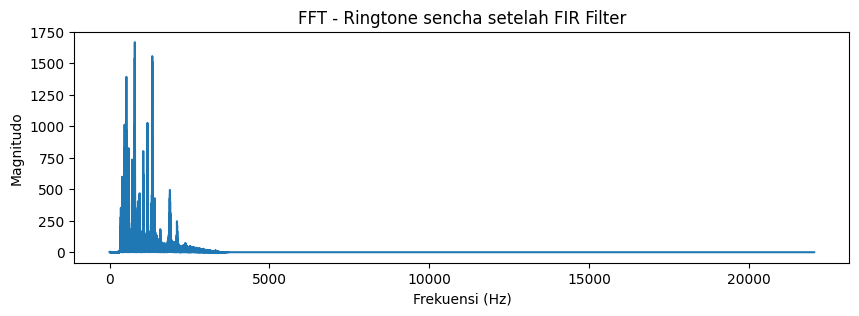

In [ ]:
plt.figure(figsize=(10,3))
librosa.display.waveshow(filtered_sencha, sr=sr_sencha)
plt.title("Waveform - Ringtone sencha setelah FIR Filter")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()

plot_fft(filtered_sencha, sr_sencha, "FFT - Ringtone sencha setelah FIR Filter")

Audio(data=filtered_sencha, rate=sr_sencha)

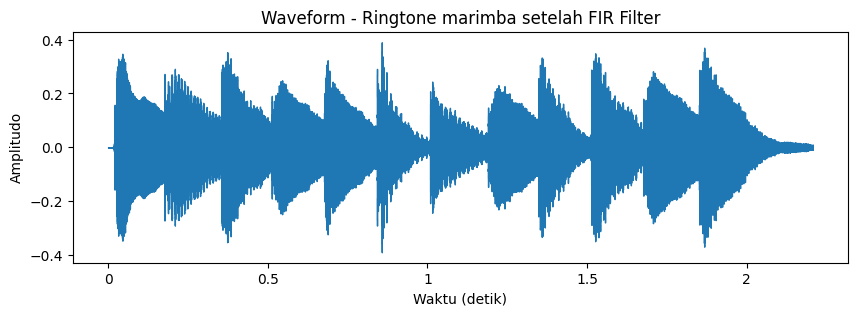

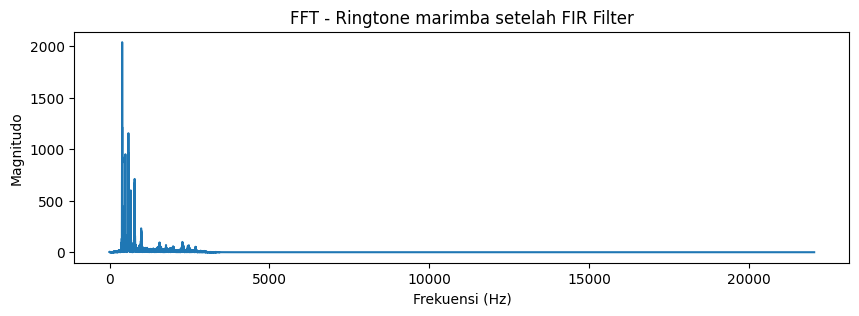

In [ ]:
plt.figure(figsize=(10,3))
librosa.display.waveshow(filtered_marimba, sr=sr_marimba)
plt.title("Waveform - Ringtone marimba setelah FIR Filter")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()

plot_fft(filtered_marimba, sr_marimba, "FFT - Ringtone marimba setelah FIR Filter")

Audio(data=filtered_marimba, rate=sr_marimba)

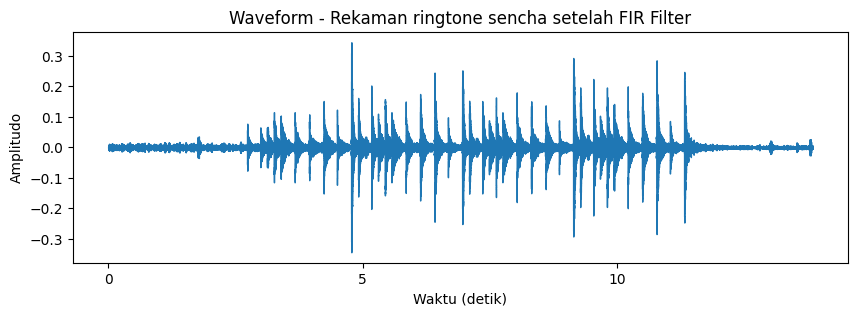

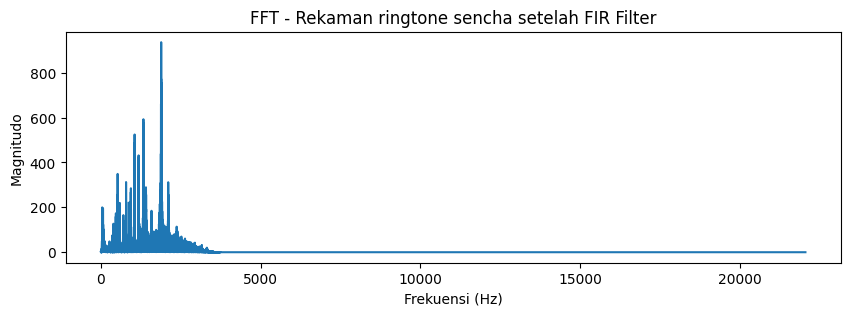

In [ ]:
plt.figure(figsize=(10,3))
librosa.display.waveshow(filtered_rekam_sencha, sr=sr_rekam_sencha)
plt.title("Waveform - Rekaman ringtone sencha setelah FIR Filter")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()

plot_fft(filtered_rekam_sencha, sr_rekam_sencha, "FFT - Rekaman ringtone sencha setelah FIR Filter")

Audio(data=filtered_rekam_sencha, rate=sr_rekam_sencha)

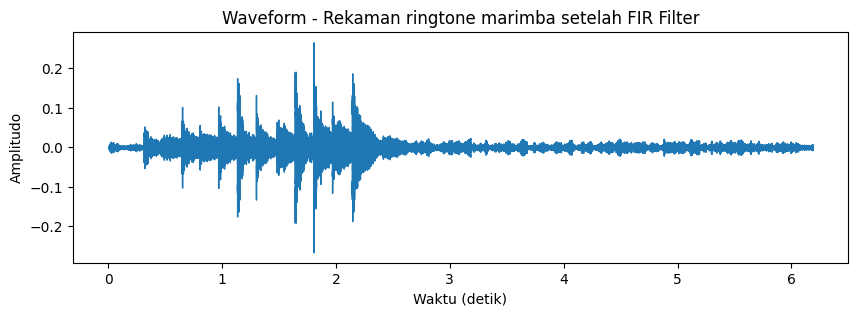

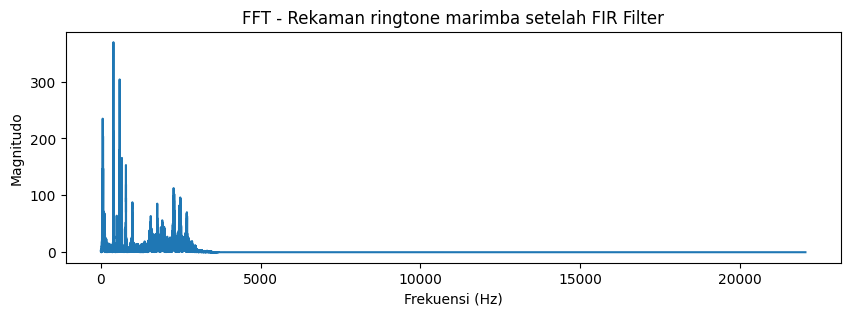

In [ ]:
plt.figure(figsize=(10,3))
librosa.display.waveshow(filtered_rekam_marimba, sr=sr_rekam_marimba)
plt.title("Waveform - Rekaman ringtone marimba setelah FIR Filter")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()

plot_fft(filtered_rekam_marimba, sr_rekam_marimba, "FFT - Rekaman ringtone marimba setelah FIR Filter")

Audio(data=filtered_rekam_marimba, rate=sr_rekam_marimba)

SNR

In [ ]:
def snr_fft(signal):
  fft_vals = np.abs(np.fft.rfft(signal))
  power_total = np.sum(fft_vals**2)

  idx_peak = np.argmax(fft_vals)
  power_signal = fft_vals[idx_peak]**2

  power_noise = power_total - power_signal

  snr = 10 * np.log10(power_signal / power_noise)
  return snr

Perhitungan SNR dilakukan dengan mengubah sinyal ke domain frekuensi menggunakan FFT, lalu menghitung daya total sebagai jumlah kuadrat magnitudo spektrum. Puncak spektrum dianggap sebagai daya sinyal utama, sedangkan sisa daya dianggap sebagai noise. Nilai SNR kemudian dihitung sebagai rasio daya sinyal terhadap daya noise dalam skala desibel (dB).

In [ ]:
snr_sencha = snr_fft(sencha_trim)
snr_marimba = snr_fft(marimba_trim)
snr_rekam_sencha = snr_fft(rekam_sencha_trim)
snr_rekam_marimba = snr_fft(rekam_marimba_trim)

print(f"SNR ringtone sencha sebelum filter: {snr_sencha:.2f} dB")
print(f"SNR ringtone marimba sebelum filter: {snr_marimba:.2f} dB")
print(f"SNR rekaman ringtone sencha sebelum filter: {snr_rekam_sencha:.2f} dB")
print(f"SNR rekaman ringtone marimba sebelum filter: {snr_rekam_marimba:.2f} dB")

SNR ringtone sencha sebelum filter: -18.40 dB
SNR ringtone marimba sebelum filter: -9.89 dB
SNR rekaman ringtone sencha sebelum filter: -20.74 dB
SNR rekaman ringtone marimba sebelum filter: -18.44 dB


In [ ]:
snr_sencha_filter = snr_fft(filtered_sencha)
snr_marimba_filter = snr_fft(filtered_marimba)
snr_rekam_sencha_filter = snr_fft(filtered_rekam_sencha)
snr_rekam_marimba_filter = snr_fft(filtered_rekam_marimba)

print(f"SNR ringtone sencha sesudah filter: {snr_sencha_filter:.2f} dB")
print(f"SNR ringtone marimba sesudah filter: {snr_marimba_filter:.2f} dB")
print(f"SNR rekaman ringtone sencha sesudah filter: {snr_rekam_sencha_filter:.2f} dB")
print(f"SNR rekaman ringtone marimba sesudah filter: {snr_rekam_marimba_filter:.2f} dB")

SNR ringtone sencha sesudah filter: -18.32 dB
SNR ringtone marimba sesudah filter: -9.87 dB
SNR rekaman ringtone sencha sesudah filter: -20.17 dB
SNR rekaman ringtone marimba sesudah filter: -17.71 dB


HASIL ANALISIS

In [ ]:
snr_sencha = snr_fft(sencha_trim)
snr_marimba = snr_fft(marimba_trim)
snr_rekam_sencha = snr_fft(rekam_sencha_trim)
snr_rekam_marimba = snr_fft(rekam_marimba_trim)
snr_sencha_filter = snr_fft(filtered_sencha)
snr_marimba_filter = snr_fft(filtered_marimba)
snr_rekam_sencha_filter = snr_fft(filtered_rekam_sencha)
snr_rekam_marimba_filter = snr_fft(filtered_rekam_marimba)

data_snr = {
    "SNR ringtone sencha": snr_sencha,
    "SNR ringtone marimba": snr_marimba,
    "SNR rekaman ringtone sencha": snr_rekam_sencha,
    "SNR rekaman ringtone marimba": snr_rekam_marimba,
    "SNR ringtone sencha sesudah filter": snr_sencha_filter,
    "SNR ringtone marimba sesudah filter": snr_marimba_filter,
    "SNR rekaman ringtone sencha sesudah filter": snr_rekam_sencha_filter,
    "SNR rekaman ringtone marimba sesudah filter": snr_rekam_marimba_filter
}

kualitas_terbaik = max(data_snr, key=data_snr.get)
nilai_terbaik = data_snr[kualitas_terbaik]

print("HASIL ANALISIS KUALITAS")
for nama, snr in data_snr.items():
    print(f"{nama} : {snr:.2f} dB")

print("\nAudio dengan kualitas terbaik adalah:")
print(f"{kualitas_terbaik} dengan nilai SNR = {nilai_terbaik:.2f} dB")

HASIL ANALISIS KUALITAS
SNR ringtone sencha : -18.40 dB
SNR ringtone marimba : -9.89 dB
SNR rekaman ringtone sencha : -20.74 dB
SNR rekaman ringtone marimba : -18.44 dB
SNR ringtone sencha sesudah filter : -18.32 dB
SNR ringtone marimba sesudah filter : -9.87 dB
SNR rekaman ringtone sencha sesudah filter : -20.17 dB
SNR rekaman ringtone marimba sesudah filter : -17.71 dB

Audio dengan kualitas terbaik adalah:
SNR ringtone marimba sesudah filter dengan nilai SNR = -9.87 dB
